In [102]:
from analysis import *
import numpy as np
import matplotlib.pyplot as plt
import collections, numpy
import psycopg2
import pandas as pd
import scipy.interpolate
import scipy.stats
import scipy.signal
import ast
import sklearn.decomposition
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import re
from pandas import DataFrame
from matplotlib.pyplot import figure


conn = connect_db("127.0.0.1","candlook_hvl")

In [109]:
tasks= (get_all_tasks(conn,"Austevoll"))
print(tasks)
#read_entity(conn, "subject")

['DiagonalLeftAndBack', 'DiagonalRightAndBack', 'Heidi_1', 'Heidi_2', 'Horizontal', 'Horizontal2', 'Hos_farmor_1', 'Hos_farmor_2', 'Vertical']


In [110]:
#get_all_groups(con)
"""Read all distinct subject group names from the database."""
cur = conn.cursor()
#cur.execute("SELECT DISTINCT name FROM group_entity ORDER BY name;")
cur.execute("SELECT * FROM group_entity ORDER BY id;")
res = cur.fetchall()  # flatten result
#res = [r[0] for r in cur.fetchall()]  # flatten result
cur.close()
print(res)

[(1, 'default group'), (2, 'moivaro'), (3, 'Austevoll'), (4, 'tysnes'), (5, 'Arusha'), (6, 'moivaroIntellectuallyImpaired'), (8, 'ArushaPreTraining'), (9, 'ArushaPostTraining'), (10, 'ArushaRescreening'), (11, 'ArushaControl'), (12, 'DAT')]


In [131]:
test = read_task_data(conn, "moivaroIntellectuallyImpaired", "DiagonalRightAndBack")

oneRecord = filter(lambda x: x['recording_id'] == 1993, test)
oneRecord
print(oneRecord)

In [116]:
get_specific_group_entities(conn,5) #giving group id in parameter #the first id in the result is subject_id

[(181, '108 al', None, 5, None, None),
 (182, '109 al', None, 5, None, None),
 (183, '110 al', None, 5, None, None),
 (184, '111 al', None, 5, None, None),
 (185, '112 al', None, 5, None, None),
 (186, '113 al', None, 5, None, None),
 (187, '114 al', None, 5, None, None),
 (188, '115 al', None, 5, None, None),
 (189, '116 al', None, 5, None, None),
 (190, '117 al', None, 5, None, None),
 (191, '118 al', None, 5, None, None),
 (192, '119 al', None, 5, None, None),
 (193, '120 al', None, 5, None, None),
 (194, '121 al', None, 5, None, None),
 (195, '122 al', None, 5, None, None),
 (196, '123 al', None, 5, None, None),
 (197, '124 al', None, 5, None, None),
 (198, '125 al', None, 5, None, None),
 (199, '126 al', None, 5, None, None),
 (200, '50 (glasses)', None, 5, None, None),
 (201, '50 a (no glasses)', None, 5, None, None),
 (202, '52 a', None, 5, None, None),
 (203, '52 b', None, 5, None, None),
 (204, '97 al', None, 5, None, None),
 (205, '98 al', None, 5, None, None),
 (206, '99 al'

In [117]:
get_specific_subject_entities(conn,199) #giving subject id and getting screening id

[(2, 199, datetime.date(2018, 11, 9), None, 1600.0, 900.0, 309.0, 173.8125)]

In [ ]:
get_specific_recording(conn,2) #giving recording id and getttig recording id of a specific person

[(1993,
  'Animation - Task Type: Saccade Speed Test',
  datetime.datetime(2018, 11, 9, 9, 31, 30, 962817),
  218,
  1806647490,
  1819915725,
  None,
  703,
  True,
  2),
 (1994,
  'DiagonalLeftAndBack Smooth',
  datetime.datetime(2018, 11, 9, 9, 31, 5, 158734),
  218,
  1767083158,
  1794121858,
  None,
  5218,
  True,
  2),
 (1995,
  'DiagonalRightAndBack Smooth',
  datetime.datetime(2018, 11, 9, 9, 30, 30, 673619),
  218,
  1732596852,
  1759632961,
  None,
  5142,
  True,
  2),
 (1996,
  'Horizontal2 Smooth',
  datetime.datetime(2018, 11, 9, 9, 29, 55, 389959),
  218,
  1703865878,
  1724351144,
  None,
  2511,
  True,
  2),
 (1998,
  'DiagonalRightAndBack, 10 fixations',
  datetime.datetime(2018, 11, 9, 9, 28, 59, 815087),
  218,
  1641743894,
  1668780003,
  None,
  2509,
  True,
  2),
 (1999,
  'DiagonalLeftAndBack, 10 fixations',
  datetime.datetime(2018, 11, 9, 9, 28, 24, 930534),
  218,
  1606855046,
  1633902259,
  None,
  2508,
  True,
  2),
 (2000,
  'Vertical, 10 fixatio

In [124]:
#sample=get_sample_recording(con,1896)
recording_id=1993
"""Read data of a specific sample (task)"""
cur = conn.cursor()
cur.execute("SELECT recording_id, timestamp, left_pupil_diameter_mm, right_pupil_diameter_mm, left_x, left_y, right_x, right_y FROM sample_entity WHERE recording_id=%(id)s", {'id': recording_id})
#res = cur.fetchall() #it is all data of result

#converting panda DataFrame
df = pd.DataFrame(cur.fetchall(), columns=['recording_id', 'timestamp', 'left_pupil_diameter_mm', 'right_pupil_diameter_mm', 'left_x', 'left_y', 'right_x', 'right_y'])




#timestamp = [r[1] for r in cur.fetchall()]  # flatten result
#cur.execute("SELECT recording_id, timestamp, left_pupil_diameter_mm, right_pupil_diameter_mm FROM sample_entity WHERE recording_id=%(id)s", {'id': recording_id})
#lefteye = [r[2] for r in cur.fetchall()]  # flatten result
#cur.execute("SELECT recording_id, timestamp, left_pupil_diameter_mm, right_pupil_diameter_mm FROM sample_entity WHERE recording_id=%(id)s", {'id': recording_id})
#rightteye = [r[3] for r in cur.fetchall()]  # flatten result

cur.close()


# left_noise = df[ df['left_pupil_diameter_mm'] == -1.00000 ].index
# df.drop(left_noise , inplace=True)
# right_noise = df[ df['right_pupil_diameter_mm'] == -1.00000 ].index
# df.drop(right_noise , inplace=True)
left_noise = df[ df['left_x'] == -1.00000 ].index
df.drop(left_noise , inplace=True)
right_noise = df[ df['right_x'] == -1.00000 ].index
df.drop(right_noise , inplace=True)


#https://www.calculateme.com/time/nanoseconds/to-seconds/1


time=df['timestamp']/1000000 #converting it to miliseconds
print(time)


#for x in df['timestamp'].iteritems():
    #print(type(x))

print(df)

UndefinedColumn: column "left_x" does not exist
LINE 1: ... left_pupil_diameter_mm, right_pupil_diameter_mm, left_x, le...
                                                             ^


0       1806.647490
1       1806.658593
2       1806.669696
3       1806.680800
4       1806.691903
           ...     
1191    1819.871312
1192    1819.882415
1193    1819.893518
1194    1819.904621
1195    1819.915725
Name: timestamp, Length: 1186, dtype: float64
      recording_id   timestamp  left_pupil_diameter_mm  \
0             1993  1806647490                2.612961   
1             1993  1806658593                2.649674   
2             1993  1806669696                2.680099   
3             1993  1806680800                2.686005   
4             1993  1806691903                2.663330   
...            ...         ...                     ...   
1191          1993  1819871312                3.187180   
1192          1993  1819882415                3.196549   
1193          1993  1819893518                3.073090   
1194          1993  1819904621                3.083283   
1195          1993  1819915725                3.099197   

      right_pupil_diameter_mm  
0    

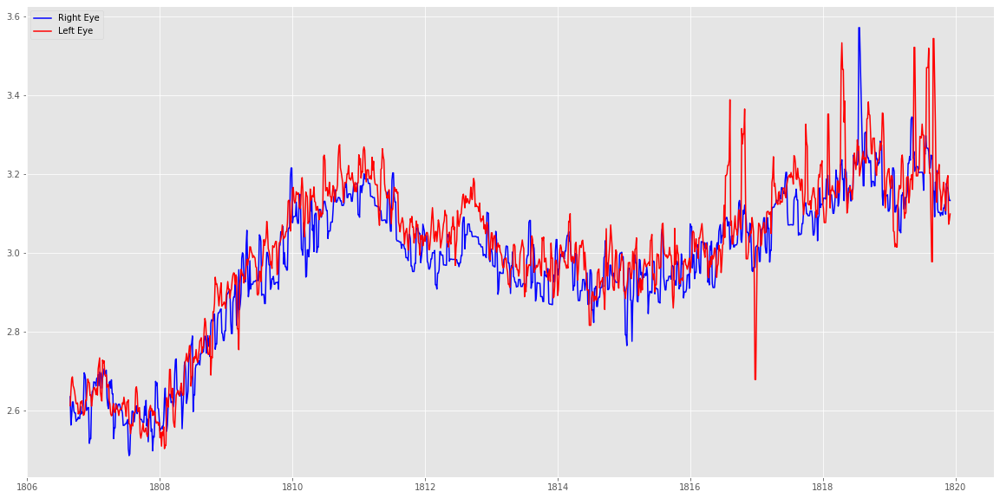

13.268235


In [ ]:
# increase picture size
f = plt.figure()
f.set_figwidth(20)
f.set_figheight(10)

#time=df['timestamp']/1000000  #converting it to miliseconds
#time=df['timestamp']/1000000000  #converting it to seconds


max_time=max(time)
min_time=min(time)
tt=(max_time-min_time)*1000
#print(time)

plt.plot(time, df['right_pupil_diameter_mm'], color='b', label='Right Eye')

# Plot another line on the same chart/graph
plt.plot(time, df['left_pupil_diameter_mm'], color='r', label='Left Eye')

plt.legend()





plt.show()

        
max_time=max(df['timestamp'])
min_time=min(df['timestamp'])
total_time=max_time-min_time #total duration of the task in nano seconds.
#total_time=total_time/1000 #convert nano second to milisecond
total_time=total_time/1000000.0 #convert nano second to seconds
print(total_time)

In [ ]:
#res = get_all_groups(con)
#res1 = get_specific_group_entities(con, 5)
#res1 = get_specific_subject_entities(con, 181)
get_all_tasks(con,"Arusha")
res3=read_task_data(con,"Arusha",tasks[1])
lefteye=np.array(res3["left_pupil_diameter_mm"])
righteye=np.array(res3["right_pupil_diameter_mm"])

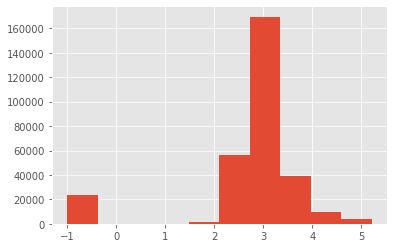

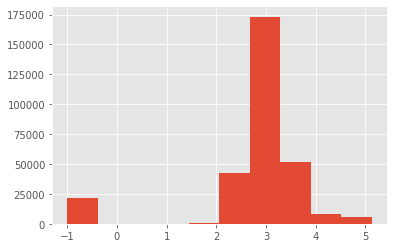

In [ ]:

x = lefteye
plt.style.use('ggplot')
plt.hist(x, bins = 10)
plt.show()

y = righteye
plt.style.use('ggplot')
plt.hist(y, bins = 10)
plt.show()


In [ ]:
import pandas 
df=pandas.DataFrame()
df['left']=lefteye

In [ ]:
import plotly.express as px
fig = px.histogram(df, x="left", marginal="rug", 
                         hover_data=df.columns)
fig.show()

In [ ]:


largest = max(lefteye)
res = collections.Counter(lefteye)
 
print(res[largest])

1


In [ ]:
type(res)

collections.Counter

In [ ]:
res[0]

0

In [ ]:
values=[]
data=[]
v1=0
for k,v in res.items():
    if k>5:
        v1=v1+1
        values.append(k)

In [ ]:
v1

1114